# `Environments Guide`

Development OS/Kernel Distro: `Ubuntu 24.04 Desktop (AMD Ryzen, 12 Threads, 128GB RAM)` & `Ubuntu 22.04 Server (HP DL360p Gen 8, 32 Threads, 256GB RAM)`

(Code has been test run on `Windows 10` and `Mac OS (M1/2)` with no environment issues)

Python: `3.10.8` across all systems using pyenv `source`

Packages & Libraries managed by `pipenv` with easy `pip install pipenv` on `python 3.10.8` followed by `pipenv shell`
(Standard `Conda Mini/Anaconda` for `python 3.10.8` supported)

##### .ipynb files are where the main logic of my code is at, and custom defined functions used regulary across notebook are store in `BoT_Exports/helper.py`, Certain code is ran on `.py` files for parallelization due to the walk forward simulations being computationally expensive (However logic is written & explained in the notebook and viewing/running those files would not be needed but are located at `BoT_Exports/data/archive` if interested)

### **Each .ipynb notebook files runtime are kept within < ~5mins, data that takes long to load have been pre-run and saved in binary pickle files in `BoT_Exports/data/` which will be called automatically. Notebook should not be compute/memory intesive outside the usual normal conditions.**

## Thank you for your time & insight. It was interesting and this project has taught me alot. I would love to hear your feedback over email(wilfred.edward.tan@gmail.com), or coffee/tea(telegram @wheelfredie or +65 93841810). Have a great week ahead!

### Notebook `0_data_ETL.ipynb`: Pre-processing & Data Integrity Checks

### Upcoming Notebook `1_Composote_export_value.ipynb`: check statistical properties of timeseries & Out of Sample forecasting of export value for individual components

### Upcoming Notebook `2_composite_weight_analysis.ipynb`: check if weights change drastically across months and Out of Sample forecast of next month(t) using last release(t-1,...,t-ar_lag) for individual components

### Upcoming Notebook `3_stitching_series.ipynb`: Restitching the Components into the Total Export Series(BoP) with Error Optimisation

# Import Relevant Packages and Custom Helper Functions 

### - Stored in `BoT_Exports/helper.py` to make code cleaner across .ipynb notebooks and .py scripts

In [1]:
from helper import *

# Ignore FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.set_option('mode.chained_assignment', None)  # to avoid SettingWithCopyWarning

# Focus on Monthly Dataset, clean into one

In [2]:
df_total_export_raw_M1 = pd.read_excel("data/given/EC_XT_009_S3_ENG_ALL.XLSX",
                                         sheet_name="Monthly")
df_total_export_raw_M2 = pd.read_excel("data/given/EC_XT_009_S3_ENG_ALL.XLSX",
                                            sheet_name="Monthly (2)")
display(df_total_export_raw_M1.head(15))
display(df_total_export_raw_M1.tail(15))
display(df_total_export_raw_M2.head(15))
display(df_total_export_raw_M2.tail(15))

,Bank of Thailand,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 246,Unnamed: 247,Unnamed: 248,Unnamed: 249,Unnamed: 250,Unnamed: 251,Unnamed: 252,Unnamed: 253,Unnamed: 254,Unnamed: 255
0,EC_XT_009_S3 : Total Value and Quantity of Exp...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,(Unit : Millions of US Dollars),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Last Updated :,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Retrieved date :,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,JAN 1995,FEB 1995,MAR 1995,APR 1995,MAY 1995,JUN 1995,JUL 1995,AUG 1995,...,MAY 2015,JUN 2015,JUL 2015,AUG 2015,SEP 2015,OCT 2015,NOV 2015,DEC 2015,JAN 2016,FEB 2016
5,1,Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,...,1401.21,1244.66,1281.52,1287.8,1103.87,1265.34,1072.05,1337.13,1127.39,1053.45
6,2,Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,...,438.86,324.54,347.33,325.72,336.15,489.78,358.57,536.23,435.28,370.95
7,3,: Quantity (Metric Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,...,945597.07,685767.92,734947.39,696920.17,720553.81,1203811.11,763417.9,1218207.85,1030307.29,836931.69
8,4,Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,...,370.3,429.17,508.8,539.7,412.81,404.41,374.58,369.64,317.32,335.13
9,5,: Quantity (Metric Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,...,257929.83,287674.6,332661.3,341658.46,309072.35,322281.9,309837.53,317833.24,285772.19,318147.37


,Bank of Thailand,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 246,Unnamed: 247,Unnamed: 248,Unnamed: 249,Unnamed: 250,Unnamed: 251,Unnamed: 252,Unnamed: 253,Unnamed: 254,Unnamed: 255
92,88,Other products,44.56,31.22,57.73,38.24,57.97,44.59,80.76,70.28,...,100.14,47.4,41.54,36.66,28.34,30.28,26.54,25.08,28.14,26.62
93,89,Re-Exports 1/,11.44,4.8,6.24,7.11,6.44,6.64,5.94,10.32,...,27.62,28.21,16.68,8.44,25.22,29.71,25.02,17.29,21.98,24.81
94,90,Total Exports (Customs basis),3995.51,3995.11,5188.91,4065.8,4880.42,5025.37,4664.11,4938.49,...,18425.52,18151.84,18206.22,17667.97,18814.41,18566.27,17162.75,17088.06,15692.45,18981.84
95,91,Adjustment for balance of payments 2/,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
96,92,Coverage Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,...,-76.3,-367.51,5.36,22.12,-205.91,-184.17,-59.87,-45.45,-56.4,-789.62
97,93,Classification adjustment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,94,Valuation Adjustment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99,95,Timing Adjustment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
100,96,"Exports, f.o.b. (BOP basis)",3928,3949,5083,4005,4789,4943,4573,4828,...,18349.21,17784.33,18211.58,17690.09,18608.49,18382.1,17102.88,17042.61,15636.04,18192.22
101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Bank of Thailand,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98
0,EC_XT_009_S3 : Total Value and Quantity of Exp...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,(Unit : Millions of US Dollars),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Last Updated :,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Retrieved date :,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,MAR 2016,APR 2016,MAY 2016,JUN 2016,JUL 2016,AUG 2016,SEP 2016,OCT 2016,...,JUN 2023 r,JUL 2023,AUG 2023,SEP 2023,OCT 2023,NOV 2023,DEC 2023,JAN 2024,FEB 2024,MAR 2024
5,1,Agriculture,1210.32,1138.96,1179.68,1059.21,899.56,1141.34,1167.05,1134.11,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
6,2,Rice,428.88,313.81,333.33,326,225.59,302.3,355.69,370.68,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
7,3,: Quantity (Metric Ton),991380.71,704952.25,728895.72,718879.6,445102.3,629600.2,787205.88,851504.06,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
8,4,Rubber,359.93,384.41,336.07,329.9,331.19,367.78,362.89,383.98,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
9,5,: Quantity (Metric Ton),335325.36,300349.17,256108.57,248608.35,256759.84,282243.17,279615.08,295557.26,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17


,Bank of Thailand,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 89,Unnamed: 90,Unnamed: 91,Unnamed: 92,Unnamed: 93,Unnamed: 94,Unnamed: 95,Unnamed: 96,Unnamed: 97,Unnamed: 98
92,88,Other products,33.48,27.99,38.9,40.76,32.07,26.21,23.01,23.3,...,30.45,28.42,23.8,7.96,12.82,10.09,31.74,18.08,26.85,32.14
93,89,Re-Exports 1/,127.26,23.99,33.82,18.98,39.06,23.23,21.39,19.34,...,10.16,17.28,18.9,13.55,16.22,27.45,11.43,21.75,13.4,7.65
94,90,Total Exports (Customs basis),19170.19,15609.27,17697.18,18152.04,17064.08,18744.78,19437.98,17756.88,...,25395.18,22143.23,24279.59,25476.26,23578.83,23479.71,22791.55,22649.88,23384.86,24960.55
95,91,Adjustment for balance of payments 2/,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
96,92,Coverage Adjustment,-470.42,12.56,18.68,-38.97,-62.62,10.48,-209.24,-164.2,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
97,93,Classification adjustment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,94,Valuation Adjustment,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99,95,Timing Adjustment,0,0,131.19,251.23,289.05,-677.84,0,0,...,0,0,0,0,0,0,0,0,0,0
100,96,"Exports, f.o.b. (BOP basis)",18699.77,15621.83,17847.05,18364.3,17290.51,18077.42,19228.75,17592.68,...,25125.59,22039.3,23195.13,25170.39,23342.17,23099.92,22380.3,22012.2,23036.45,24543.84
101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
#get headers
COLNAME_df_total_export_raw_M1 = df_total_export_raw_M1.iloc[4].tolist()
COLNAME_df_total_export_raw_M1[1] = "class"
COLNAME_df_total_export_raw_M1 = COLNAME_df_total_export_raw_M1[1:]

#remove unwanted rows 
df_total_export_raw_M1 = df_total_export_raw_M1.iloc[5:101,1:]
df_total_export_raw_M1.columns = COLNAME_df_total_export_raw_M1
df_total_export_raw_M1.reset_index(drop=True, inplace=True)
display(df_total_export_raw_M1)

#same for M(2)
COLNAME_df_total_export_raw_M2 = df_total_export_raw_M2.iloc[4].tolist()
COLNAME_df_total_export_raw_M2[1] = "class"
COLNAME_df_total_export_raw_M2 = COLNAME_df_total_export_raw_M2[1:]
#remove unwanted rows
df_total_export_raw_M2 = df_total_export_raw_M2.iloc[5:101,1:]
df_total_export_raw_M2.columns = COLNAME_df_total_export_raw_M2
df_total_export_raw_M2.reset_index(drop=True, inplace=True)
display(df_total_export_raw_M2)

#check that class order are the same
display((df_total_export_raw_M1["class"] == df_total_export_raw_M2["class"]).sum() == len(df_total_export_raw_M1["class"]))
#drop class from M2
df_total_export_raw_M2.drop(columns=["class"], inplace=True)

#side concat
df_total_export = pd.concat([df_total_export_raw_M1, df_total_export_raw_M2], axis=1)
df_total_export["class"] = [col.strip().replace(" ", "_") if isinstance(col, str) and col.strip() != "" else col for col in df_total_export["class"]]
display(df_total_export)

#remove "/" from class names
df_total_export["class"] = df_total_export["class"].str.replace("/", "")
df_total_export.to_csv("data/cleaned/total_export.csv", index=False)
df_total_export.to_pickle("data/cleaned/total_export.pkl")

,class,JAN 1995,FEB 1995,MAR 1995,APR 1995,MAY 1995,JUN 1995,JUL 1995,AUG 1995,SEP 1995,...,MAY 2015,JUN 2015,JUL 2015,AUG 2015,SEP 2015,OCT 2015,NOV 2015,DEC 2015,JAN 2016,FEB 2016
0,Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,...,1401.21,1244.66,1281.52,1287.8,1103.87,1265.34,1072.05,1337.13,1127.39,1053.45
1,Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,...,438.86,324.54,347.33,325.72,336.15,489.78,358.57,536.23,435.28,370.95
2,: Quantity (Metric Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,...,945597.07,685767.92,734947.39,696920.17,720553.81,1203811.11,763417.9,1218207.85,1030307.29,836931.69
3,Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,...,370.3,429.17,508.8,539.7,412.81,404.41,374.58,369.64,317.32,335.13
4,: Quantity (Metric Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,...,257929.83,287674.6,332661.3,341658.46,309072.35,322281.9,309837.53,317833.24,285772.19,318147.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Coverage Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,...,-76.3,-367.51,5.36,22.12,-205.91,-184.17,-59.87,-45.45,-56.4,-789.62
92,Classification adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Valuation Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Timing Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


,class,MAR 2016,APR 2016,MAY 2016,JUN 2016,JUL 2016,AUG 2016,SEP 2016,OCT 2016,NOV 2016,...,JUN 2023 r,JUL 2023,AUG 2023,SEP 2023,OCT 2023,NOV 2023,DEC 2023,JAN 2024,FEB 2024,MAR 2024
0,Agriculture,1210.32,1138.96,1179.68,1059.21,899.56,1141.34,1167.05,1134.11,1330.89,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
1,Rice,428.88,313.81,333.33,326,225.59,302.3,355.69,370.68,452.51,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
2,: Quantity (Metric Ton),991380.71,704952.25,728895.72,718879.6,445102.3,629600.2,787205.88,851504.06,1011869.83,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
3,Rubber,359.93,384.41,336.07,329.9,331.19,367.78,362.89,383.98,432.89,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
4,: Quantity (Metric Ton),335325.36,300349.17,256108.57,248608.35,256759.84,282243.17,279615.08,295557.26,308369.49,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Coverage Adjustment,-470.42,12.56,18.68,-38.97,-62.62,10.48,-209.24,-164.2,-53.56,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
92,Classification adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Valuation Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Timing Adjustment,0,0,131.19,251.23,289.05,-677.84,0,0,0,...,0,0,0,0,0,0,0,0,0,0


True

,class,JAN 1995,FEB 1995,MAR 1995,APR 1995,MAY 1995,JUN 1995,JUL 1995,AUG 1995,SEP 1995,...,JUN 2023 r,JUL 2023,AUG 2023,SEP 2023,OCT 2023,NOV 2023,DEC 2023,JAN 2024,FEB 2024,MAR 2024
0,Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
1,Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
2,:_Quantity_(Metric_Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
3,Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
4,:_Quantity_(Metric_Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Coverage_Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
92,Classification_adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Valuation_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Timing_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Check that the constituent classes sums up to the total exports, if so, we can use weighted matrix after decomposition to build back

In [4]:
class_map = pd.read_excel("data/given/MAP_exports.xlsx",
                          sheet_name="export_value")
#standardise names
class_map.columns = [col.strip().replace(" ", "_") if isinstance(col, str) and col.strip() != "" else col for col in class_map.columns]
class_map = class_map.map(lambda x: str(x).strip().replace(" ", "_") if isinstance(x, str) and x.strip() != "" else x)

#also for values 
#manufacturing has alot of subsets, however we cannot ignore as it has a huge weight contribution to the total export
# and seasonality might differ between components
manufacturing_map = pd.read_excel("data/given/MAP_exports.xlsx",
                                    sheet_name="manufacturing export_value")
#standardise names
manufacturing_map.columns = [col.strip().replace(" ", "_") if isinstance(col, str) and col.strip() != "" else col for col in manufacturing_map.columns]
manufacturing_map = manufacturing_map.map(lambda x: str(x).strip().replace(" ", "_") if isinstance(x, str) and x.strip() != "" else x)


display(class_map)
display(manufacturing_map)

,Agriculture,Fishery,Forestry,Mining,Manufacturing,Other_Exports,Re-Exports_1,Total_Exports_(Customs_basis)
0,Rice,Crustaceans,NaN,Crude_oil,Agro-manufacturing_Products,Non-monetary_gold_(excl._articles_of_goldsmiths),NaN,NaN
1,Rubber,Fish,NaN,"Mineral_products,_n.i.e.",Apparels_and_Textile_Materials,Other_products,NaN,NaN
2,Durian,"Cuttlefish,_squid,_octopus",NaN,NaN,Footware_and_parts,NaN,NaN,NaN
3,Other_Fruits,"Fishery_products,_n.i.e.",NaN,NaN,Electronics,NaN,NaN,NaN
4,"Horticultural_products,_n.i.e.",NaN,NaN,NaN,Electrical_Appliances,NaN,NaN,NaN
5,Animal_products,NaN,NaN,NaN,Metal_&_Steel,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,Automotive,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,"Aircrafts,_ships,_floating_structures,_and_loc...",NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,Machinery_&_Equipment,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,Jewellery,NaN,NaN,NaN


,Agro-manufacturing_Products,Apparels_and_Textile_Materials,Footware_and_parts,Electronics,Electrical_Appliances,Metal_&_Steel,Automotive,"Aircrafts,_ships,_floating_structures,_and_locomotive",Machinery_&_Equipment,Jewellery,Chemicals_&_Petro-chemical_Products,Petroleum_products,Photographic_&_cinematographic_instruments_&_supplies,Medicinal_and_surgical_equipment_and_supplies,Toiletries_and_cosmetics,Furniture_and_parts,Other_Manufacturing_products
0,Sugar,NaN,NaN,Computer,Air_conditioning_machines,Iron_&_steel,Passenger_car,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Fish,_canned,_prepared,_or_preserved",NaN,NaN,Computer_parts_&_accessories,Refrigerators,Aluminium,Pick_up_and_trucks,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Crustaceans_canned,_prepared,_or_preserved",NaN,NaN,Integrated_circuits_&_parts,Parts_of_electrical_appliances,Copper,Motorcycle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Meat_of_poultry,_canned,_prepared,_or_preserved",NaN,NaN,Printed_circuits,Electrical_control_devices,Other_metal_&_steel,"Other_vehicles,_n.i.e.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Tapioca_&_cassava_starch,NaN,NaN,Telecommunication_equipments,Other_electrical_apparatus_(excl._printed_circ...,NaN,Vehicle_parts_&_accessories,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"Other_fruits_&_vegetables,_canned,_prepared,_o...",NaN,NaN,NaN,Appliances_Washing_machine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Preparation_of_cereals_flour_or_starch,NaN,NaN,NaN,Other_Electrical_Appliances,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,"Food_products,_n.i.e.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Rubber_products,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df_total_export

,class,JAN 1995,FEB 1995,MAR 1995,APR 1995,MAY 1995,JUN 1995,JUL 1995,AUG 1995,SEP 1995,...,JUN 2023 r,JUL 2023,AUG 2023,SEP 2023,OCT 2023,NOV 2023,DEC 2023,JAN 2024,FEB 2024,MAR 2024
0,Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
1,Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
2,:_Quantity_(Metric_Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
3,Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
4,:_Quantity_(Metric_Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Coverage_Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
92,Classification_adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Valuation_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Timing_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df_map_overall = pd.DataFrame({"Total_Exports_(Customs_basis)": class_map.columns[:-1]})
df_map_overall

,Total_Exports_(Customs_basis)
0,Agriculture
1,Fishery
2,Forestry
3,Mining
4,Manufacturing
5,Other_Exports
6,Re-Exports_1


In [7]:
# For export map
def is_equal_ConstituentSum(df: pd.DataFrame, 
                            df_export: pd.DataFrame) -> pd.DataFrame:
    cols = df.columns

    lst_col = []
    lst_is_equal = []
    for col in cols:
        constituents = df[col].dropna()
        if len(constituents) == 0:
            lst_col.append(col)
            lst_is_equal.append(True)
            continue 
        
        #get col timeseries
        data_col = df_export[df_export["class"] == col].iloc[0]
        
        #get timeseries for constituents & sum rows
        data_constituents = df_export[df_export["class"].isin(constituents)].sum(axis=0)
        
        #Ensure that the sum of the constituents is equal(with tolerance) to the total in col (class total)
        tolerance = 1e-2 #per constituent
        is_equal = (data_col[1:] - data_constituents[1:]).sum() <= (tolerance * len(data_col))
        
        lst_col.append(col)
        lst_is_equal.append(is_equal)
        
    df_is_equal = pd.DataFrame({"class": lst_col, "is_equal": lst_is_equal})
    return df_is_equal
    
df_is_equal_class_map = is_equal_ConstituentSum(class_map, df_total_export)
df_is_equal_manufacturing_map = is_equal_ConstituentSum(manufacturing_map, df_total_export)
df_is_equal_map_overall = is_equal_ConstituentSum(df_map_overall, df_total_export)

display(df_is_equal_class_map)
display(df_is_equal_manufacturing_map)
display(df_is_equal_map_overall)

,class,is_equal
0,Agriculture,True
1,Fishery,True
2,Forestry,True
3,Mining,True
4,Manufacturing,True
5,Other_Exports,False
6,Re-Exports_1,True
7,Total_Exports_(Customs_basis),True


,class,is_equal
0,Agro-manufacturing_Products,True
1,Apparels_and_Textile_Materials,True
2,Footware_and_parts,True
3,Electronics,True
4,Electrical_Appliances,True
5,Metal_&_Steel,True
6,Automotive,True
7,"Aircrafts,_ships,_floating_structures,_and_loc...",True
8,Machinery_&_Equipment,True
9,Jewellery,True


,class,is_equal
0,Total_Exports_(Customs_basis),True


In [8]:
#investigate the ones that are not equal: Forestry, Other Exports, Total Exports (Customs basis)	
col = "Other_Exports"
cols = class_map[col].dropna()
constituents = class_map[col].dropna()
df_export = df_total_export.copy(deep=True)

#get col timeseries
data_col = df_export[df_export["class"] == col].iloc[0]
#get timeseries for constituents & sum rows
data_constituents = df_export[df_export["class"].isin(constituents)].sum(axis=0)
diff = data_col[1:] - data_constituents[1:]
total_diff = diff.sum()

#composite & class weight
composite_weight = df_export[df_export["class"].isin(constituents)]

composite_weight.set_index("class", 
                           inplace=True, 
                           drop=True)

composite_weight = composite_weight.T

df_compare = pd.DataFrame({"class_total": data_col[1:], 
                           "constituents_total": data_constituents[1:], 
                           "diff": diff})
df_compare = pd.concat([df_compare, composite_weight], axis=1)
for col in constituents:
    df_compare[col] = df_compare[col] / df_compare["constituents_total"]


#enfore float
df_compare = df_compare.astype(float)
df_compare = df_compare.round(2)

# for diff get the outliers via quantiles
q1 = df_compare["diff"].quantile(0.25)
q3 = df_compare["diff"].quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
df_compare_outliers = df_compare[(df_compare["diff"] < lower_bound) | (df_compare["diff"] > upper_bound)]

display(total_diff)
display(df_compare)
display(df_compare_outliers)

4199.369999999999

,class_total,constituents_total,diff,Non-monetary_gold_(excl._articles_of_goldsmiths),Other_products
JAN 1995,50.89,50.72,0.17,0.12,0.88
FEB 1995,40.87,40.74,0.13,0.23,0.77
MAR 1995,67.21,66.93,0.28,0.14,0.86
APR 1995,43.43,43.21,0.22,0.12,0.88
MAY 1995,62.26,62.00,0.26,0.06,0.94
...,...,...,...,...,...
NOV 2023,266.27,263.32,2.95,0.96,0.04
DEC 2023,454.12,452.65,1.47,0.93,0.07
JAN 2024,493.70,491.55,2.15,0.96,0.04
FEB 2024,771.18,769.90,1.28,0.97,0.03


,class_total,constituents_total,diff,Non-monetary_gold_(excl._articles_of_goldsmiths),Other_products
DEC 1995,92.70,87.75,4.95,0.03,0.97
JUL 1997,98.65,78.50,20.15,0.07,0.93
FEB 2001,175.33,172.08,3.25,0.01,0.99
APR 2002,166.18,162.97,3.21,0.04,0.96
MAR 2003,296.74,286.78,9.96,0.03,0.97
APR 2004,271.70,236.90,34.80,0.05,0.95
JUN 2004,215.91,193.61,22.30,0.19,0.81
FEB 2005,139.44,129.98,9.46,0.05,0.95
MAR 2005,243.17,228.54,14.63,0.04,0.96
OCT 2005,162.73,157.91,4.82,0.12,0.88


In [9]:
#checking if the outliers are consistent across all months
len(df_compare_outliers.index.map(lambda x : x[:3]).unique())

11

weight change and total error is not small, would be better to not decompose the 'Other Exports' class

In [10]:
#remove the constituents from the class map for 'Other Exports'
class_map["Other_Exports"] = np.nan
display(class_map)
class_map.to_csv("data/cleaned/MAP_exports.csv", index=False)
class_map.to_pickle("data/cleaned/MAP_exports.pkl")

,Agriculture,Fishery,Forestry,Mining,Manufacturing,Other_Exports,Re-Exports_1,Total_Exports_(Customs_basis)
0,Rice,Crustaceans,NaN,Crude_oil,Agro-manufacturing_Products,NaN,NaN,NaN
1,Rubber,Fish,NaN,"Mineral_products,_n.i.e.",Apparels_and_Textile_Materials,NaN,NaN,NaN
2,Durian,"Cuttlefish,_squid,_octopus",NaN,NaN,Footware_and_parts,NaN,NaN,NaN
3,Other_Fruits,"Fishery_products,_n.i.e.",NaN,NaN,Electronics,NaN,NaN,NaN
4,"Horticultural_products,_n.i.e.",NaN,NaN,NaN,Electrical_Appliances,NaN,NaN,NaN
5,Animal_products,NaN,NaN,NaN,Metal_&_Steel,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,Automotive,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,"Aircrafts,_ships,_floating_structures,_and_loc...",NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,Machinery_&_Equipment,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,Jewellery,NaN,NaN,NaN


In [11]:
#manufacturing no changes
manufacturing_map.to_csv("data/cleaned/manufacturing_MAP_exports.csv", index=False)
manufacturing_map.to_pickle("data/cleaned/manufacturing_MAP_exports.pkl")

In [12]:
df_total_export

,class,JAN 1995,FEB 1995,MAR 1995,APR 1995,MAY 1995,JUN 1995,JUL 1995,AUG 1995,SEP 1995,...,JUN 2023 r,JUL 2023,AUG 2023,SEP 2023,OCT 2023,NOV 2023,DEC 2023,JAN 2024,FEB 2024,MAR 2024
0,Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
1,Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
2,:_Quantity_(Metric_Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
3,Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
4,:_Quantity_(Metric_Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,Coverage_Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
92,Classification_adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
93,Valuation_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
94,Timing_Adjustment,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Convert and Standardise Month-Year to Datetime

In [13]:
#change months-year to datetime
display(df_total_export.columns)
df_total_export.set_index("class", inplace=True)
display(df_total_export.columns)
# change index to datetime
dates = df_total_export.columns

wrong_dates = []
for date in dates:
    try:
        pd.to_datetime(date, format='%b %Y ')
    except ValueError as e:
        wrong_dates.append(date)
        
display(wrong_dates)

Index(['class', 'JAN 1995 ', 'FEB 1995 ', 'MAR 1995 ', 'APR 1995 ',
       'MAY 1995 ', 'JUN 1995 ', 'JUL 1995 ', 'AUG 1995 ', 'SEP 1995 ',
       ...
       'JUN 2023 r', 'JUL 2023 ', 'AUG 2023 ', 'SEP 2023 ', 'OCT 2023 ',
       'NOV 2023 ', 'DEC 2023 ', 'JAN 2024 ', 'FEB 2024 ', 'MAR 2024 '],
      dtype='object', length=352)

Index(['JAN 1995 ', 'FEB 1995 ', 'MAR 1995 ', 'APR 1995 ', 'MAY 1995 ',
       'JUN 1995 ', 'JUL 1995 ', 'AUG 1995 ', 'SEP 1995 ', 'OCT 1995 ',
       ...
       'JUN 2023 r', 'JUL 2023 ', 'AUG 2023 ', 'SEP 2023 ', 'OCT 2023 ',
       'NOV 2023 ', 'DEC 2023 ', 'JAN 2024 ', 'FEB 2024 ', 'MAR 2024 '],
      dtype='object', length=351)

['JAN 2023 r',
 'FEB 2023 r',
 'MAR 2023 r',
 'APR 2023 r',
 'MAY 2023 r',
 'JUN 2023 r']

In [14]:
#fix the dates
fixed_dates = []
wrong_dates = []
for date in dates:
    try:
        pd.to_datetime(date, format='%b %Y ')
        fixed_dates.append(date)
    except ValueError as e:
        date = date.replace('r', '')
        fixed_dates.append(date)
        
for date in fixed_dates:
    try:
        pd.to_datetime(date, format='%b %Y ')
    except ValueError as e:
        wrong_dates.append(date)        
        
display(wrong_dates)

[]

In [15]:
df_total_export.columns = pd.to_datetime(fixed_dates, format='%b %Y ')
display(df_total_export.columns)
display(df_total_export)

DatetimeIndex(['1995-01-01', '1995-02-01', '1995-03-01', '1995-04-01',
               '1995-05-01', '1995-06-01', '1995-07-01', '1995-08-01',
               '1995-09-01', '1995-10-01',
               ...
               '2023-06-01', '2023-07-01', '2023-08-01', '2023-09-01',
               '2023-10-01', '2023-11-01', '2023-12-01', '2024-01-01',
               '2024-02-01', '2024-03-01'],
              dtype='datetime64[ns]', length=351, freq=None)

,1995-01-01,1995-02-01,1995-03-01,1995-04-01,1995-05-01,1995-06-01,1995-07-01,1995-08-01,1995-09-01,1995-10-01,...,2023-06-01,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01,2024-02-01,2024-03-01
class,,,,,,,,,,,,,,,,,,,,,
Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,397.83,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,133.59,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
:_Quantity_(Metric_Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,392002.58,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,170.94,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
:_Quantity_(Metric_Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,136422.37,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Coverage_Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,-81.76,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
Classification_adjustment,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Valuation_Adjustment,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
#check that for every year 1995-2023, there are 12 months; and 2024 has up till March
df_total_export.columns.map(lambda x : x.year).value_counts().sort_index() #all 12 months for 1995-2023, 3 months for 2024; DATA PRESENT

1995    12
1996    12
1997    12
1998    12
1999    12
2000    12
2001    12
2002    12
2003    12
2004    12
2005    12
2006    12
2007    12
2008    12
2009    12
2010    12
2011    12
2012    12
2013    12
2014    12
2015    12
2016    12
2017    12
2018    12
2019    12
2020    12
2021    12
2022    12
2023    12
2024     3
Name: count, dtype: int64

In [17]:
#save
df_total_export.to_csv("data/cleaned/total_export.csv")
df_total_export.to_pickle("data/cleaned/total_export.pkl")

# Analyse weights month on month change

'Total_Exports_(Customs_basis)'

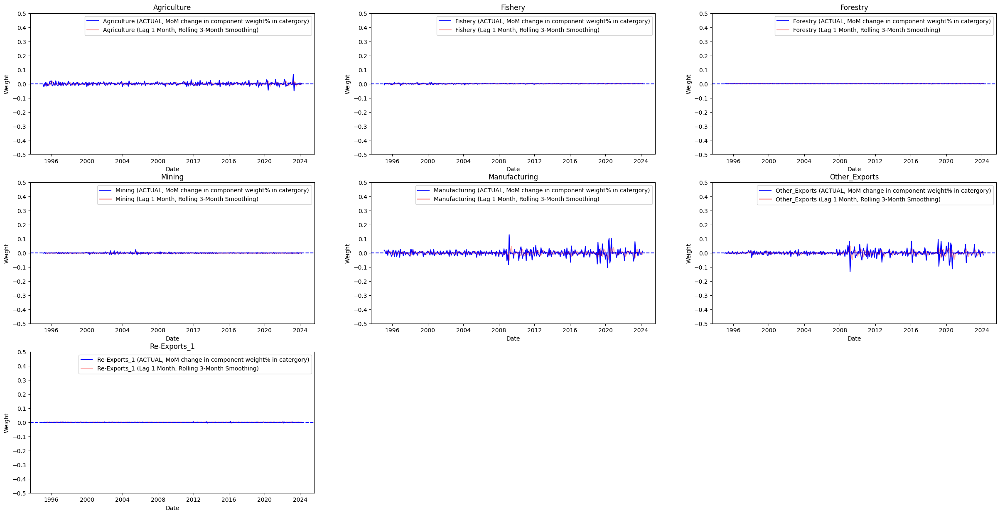

'Agriculture'

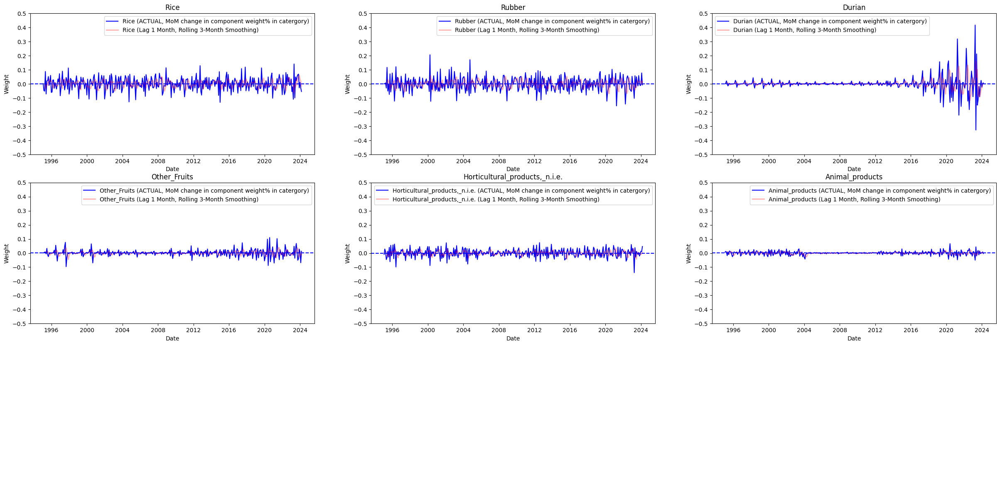

'Fishery'

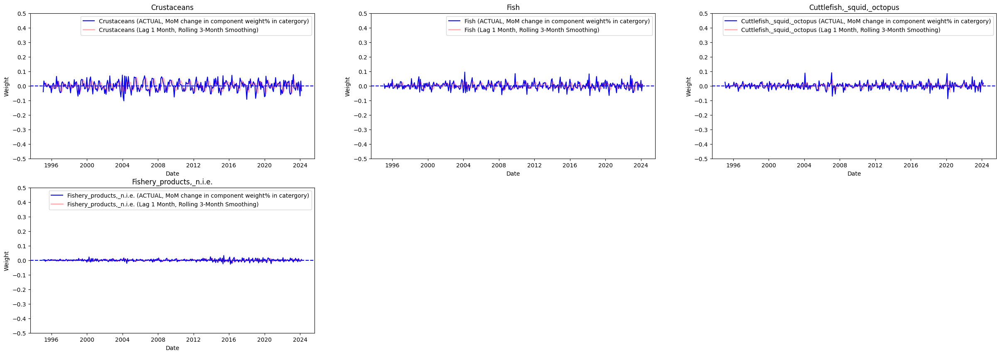

'Mining'

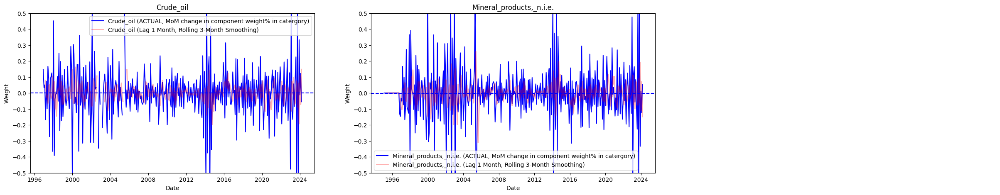

'Manufacturing'

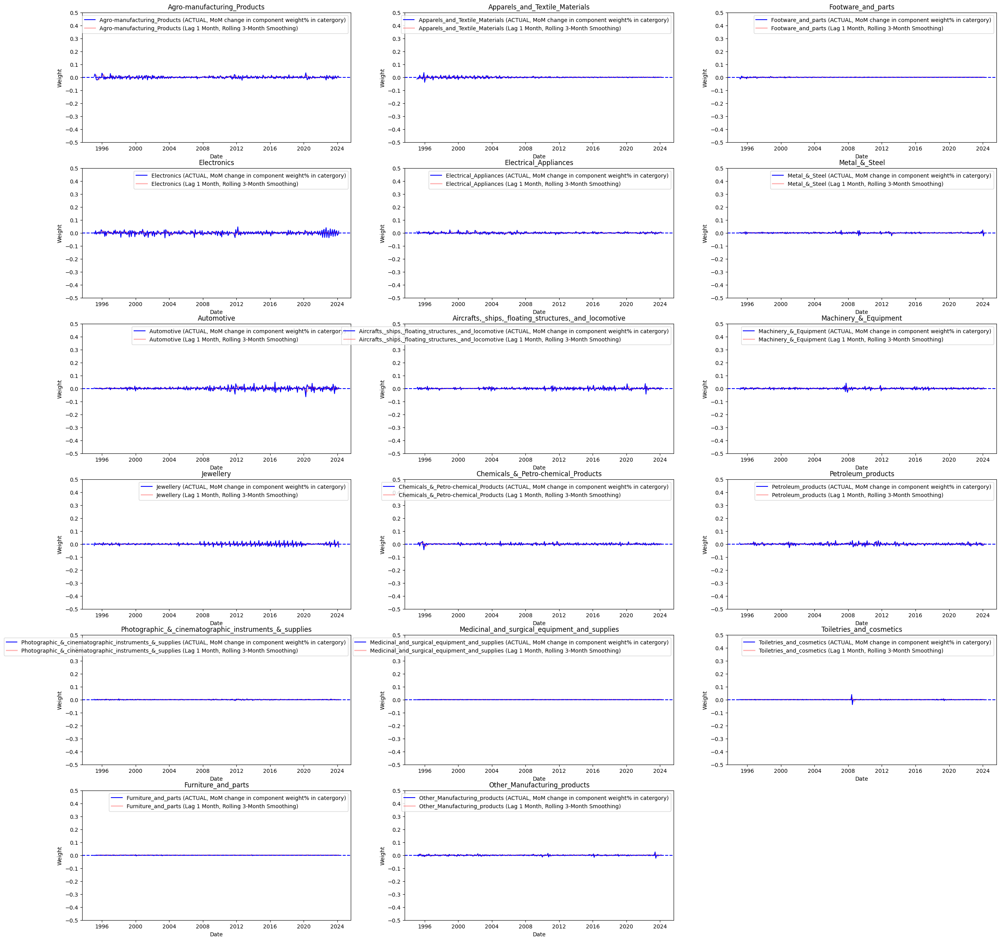

'Agro-manufacturing_Products'

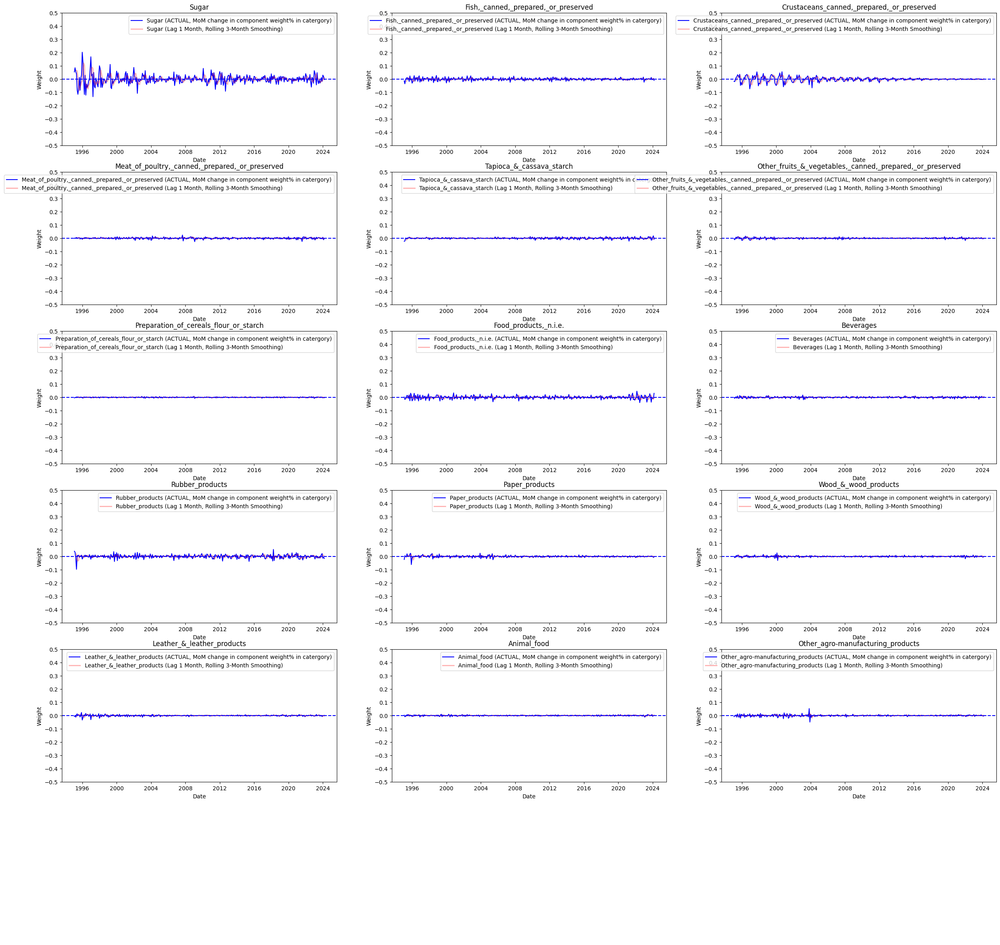

'Electronics'

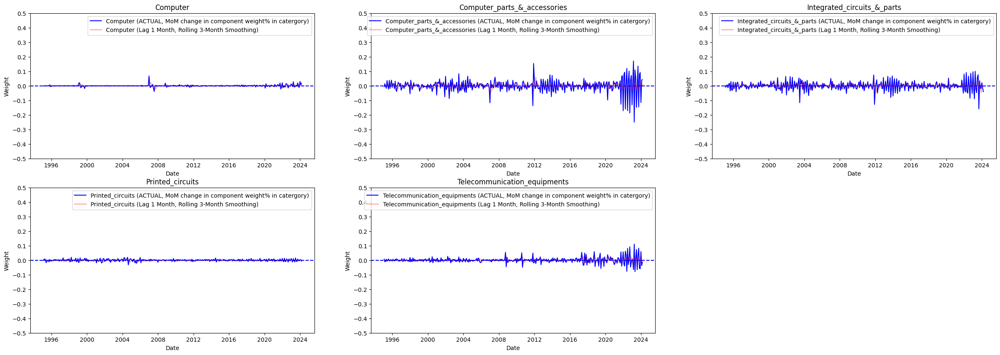

'Electrical_Appliances'

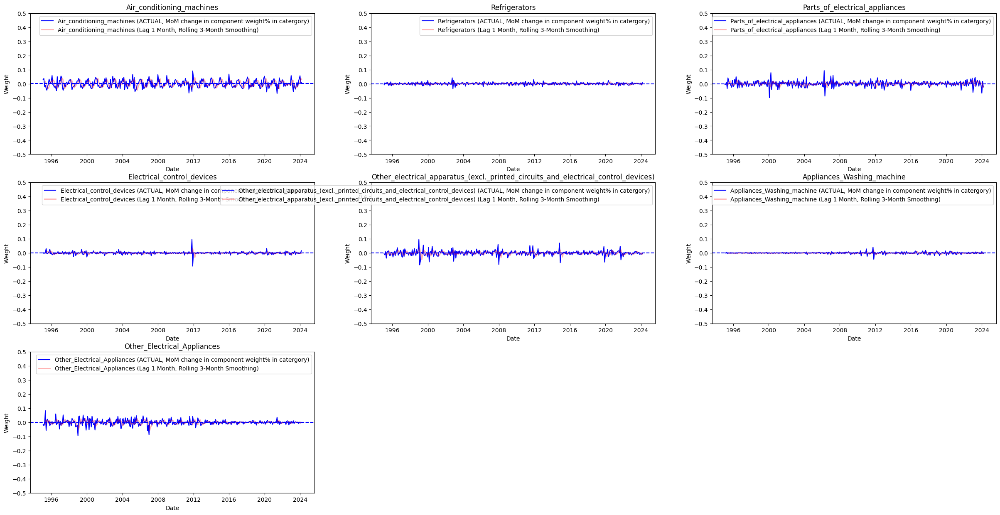

'Metal_&_Steel'

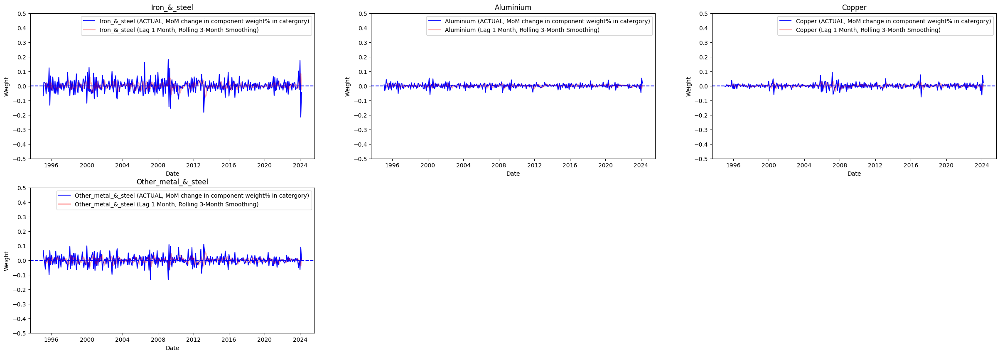

'Automotive'

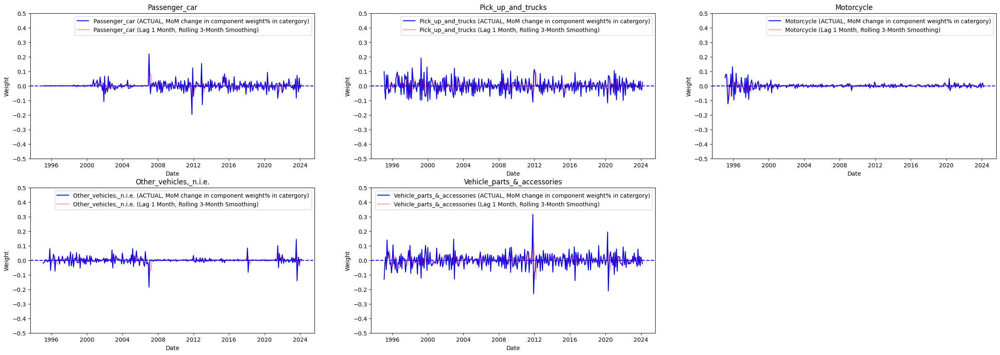

In [18]:
# For export map
def analyseComponentsWeight(df: pd.DataFrame, 
                            df_export: pd.DataFrame) -> pd.DataFrame:
    cols = df.columns

    for col in cols:
        constituents = df[col].dropna()
        if len(constituents) == 0:
            # data_col = df_export[df_export.index == col].iloc[0]
            # data_col = data_col.T.pct_change(axis=0)
            continue 
        
        #get col timeseries
        data_col = df_export[df_export.index == col].iloc[0, 1:]

        #get timeseries for constituents & sum rows
        data_constituents = df_export[df_export.index.isin(constituents)]
        data_constituents_sum = df_export[df_export.index.isin(constituents)].sum(axis=0)

        #data_constituents weight
        data_constituents_weight = data_constituents.div(data_constituents_sum, axis=1)
        data_constituents_weight = data_constituents_weight.T
        
        display(col)
        # display(data_constituents_weight)
        # Plot data
        ncols = 3
        nrows = len(data_constituents_weight.columns) // ncols + 1
        nplots = len(data_constituents_weight.columns)
         
        fig, ax = plt.subplots(figsize=(30, nrows * 5),
                               nrows=nrows, ncols=ncols)
        ax = ax.flatten()
        
        for i, col in enumerate(data_constituents_weight.columns):
            ax[i].plot(data_constituents_weight[col].diff(),
                       label=f"{col} (ACTUAL, MoM change in component weight% in catergory)", alpha=1, color='b')
            
            ax[i].plot(data_constituents_weight[col].shift(1).rolling(window=3).mean().diff(),
                       label=f"{col} (Lag 1 Month, Rolling 3-Month Smoothing)", linewidth=2, alpha=0.3,
                       color='r')
            # ax[i].plot(data_constituents_weight[col].shift(1).ewm(span=2).mean().diff(),
            #            label=f"{col} (Lag 1 Month, Rolling 3-Month Smoothing)", linewidth=3, alpha=0.3,
            #            color='r')
            ax[i].set_xlabel("Date")
            ax[i].set_ylabel("Weight")
            #draw mean line
            ax[i].axhline(data_constituents_weight[col].diff().mean(), color='b', linestyle='--')
            ax[i].legend()
            ax[i].set_title(col)
            
            # Set y-axis limits
            ax[i].set_ylim(-0.5, 0.5)
            ax[i].set_yticks(list(np.arange(-0.5, 0.6, 0.1)))
            
        #hide remaining plots
        for i in range(nplots, nrows * ncols):
            ax[i].axis('off')
            
        plt.show()
analyseComponentsWeight(df_map_overall, df_total_export)
analyseComponentsWeight(class_map, df_total_export)
analyseComponentsWeight(manufacturing_map, df_total_export)

Generally, the MoM weight change is not drastic and can be modelled using smoothening, however some components do have fluctuation which might benefit from further timeseries transformation like deseasonality

# simplify df into the timeseries needed for analysis

In [19]:
class_map = pd.read_pickle("data/cleaned/MAP_exports.pkl")
manufacturing_map = pd.read_pickle("data/cleaned/manufacturing_MAP_exports.pkl")
df_total_export = pd.read_pickle("data/cleaned/total_export.pkl")
display(class_map)
display(manufacturing_map)
display(df_total_export)

,Agriculture,Fishery,Forestry,Mining,Manufacturing,Other_Exports,Re-Exports_1,Total_Exports_(Customs_basis)
0,Rice,Crustaceans,NaN,Crude_oil,Agro-manufacturing_Products,NaN,NaN,NaN
1,Rubber,Fish,NaN,"Mineral_products,_n.i.e.",Apparels_and_Textile_Materials,NaN,NaN,NaN
2,Durian,"Cuttlefish,_squid,_octopus",NaN,NaN,Footware_and_parts,NaN,NaN,NaN
3,Other_Fruits,"Fishery_products,_n.i.e.",NaN,NaN,Electronics,NaN,NaN,NaN
4,"Horticultural_products,_n.i.e.",NaN,NaN,NaN,Electrical_Appliances,NaN,NaN,NaN
5,Animal_products,NaN,NaN,NaN,Metal_&_Steel,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,Automotive,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,"Aircrafts,_ships,_floating_structures,_and_loc...",NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,Machinery_&_Equipment,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,Jewellery,NaN,NaN,NaN


,Agro-manufacturing_Products,Apparels_and_Textile_Materials,Footware_and_parts,Electronics,Electrical_Appliances,Metal_&_Steel,Automotive,"Aircrafts,_ships,_floating_structures,_and_locomotive",Machinery_&_Equipment,Jewellery,Chemicals_&_Petro-chemical_Products,Petroleum_products,Photographic_&_cinematographic_instruments_&_supplies,Medicinal_and_surgical_equipment_and_supplies,Toiletries_and_cosmetics,Furniture_and_parts,Other_Manufacturing_products
0,Sugar,NaN,NaN,Computer,Air_conditioning_machines,Iron_&_steel,Passenger_car,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Fish,_canned,_prepared,_or_preserved",NaN,NaN,Computer_parts_&_accessories,Refrigerators,Aluminium,Pick_up_and_trucks,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"Crustaceans_canned,_prepared,_or_preserved",NaN,NaN,Integrated_circuits_&_parts,Parts_of_electrical_appliances,Copper,Motorcycle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Meat_of_poultry,_canned,_prepared,_or_preserved",NaN,NaN,Printed_circuits,Electrical_control_devices,Other_metal_&_steel,"Other_vehicles,_n.i.e.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Tapioca_&_cassava_starch,NaN,NaN,Telecommunication_equipments,Other_electrical_apparatus_(excl._printed_circ...,NaN,Vehicle_parts_&_accessories,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"Other_fruits_&_vegetables,_canned,_prepared,_o...",NaN,NaN,NaN,Appliances_Washing_machine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Preparation_of_cereals_flour_or_starch,NaN,NaN,NaN,Other_Electrical_Appliances,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,"Food_products,_n.i.e.",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Rubber_products,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,1995-01-01,1995-02-01,1995-03-01,1995-04-01,1995-05-01,1995-06-01,1995-07-01,1995-08-01,1995-09-01,1995-10-01,...,2023-06-01,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01,2024-02-01,2024-03-01
class,,,,,,,,,,,,,,,,,,,,,
Agriculture,584.19,550.96,605.24,453.51,587.16,516.47,511.33,472.17,430.56,397.83,...,2067.89,1664.59,1664.33,1775.44,1532.07,1552.72,1394.08,1536.73,1446.91,1576.87
Rice,196.61,186.2,175.64,107.99,191.15,130.92,140.19,139.66,149.49,133.59,...,327.64,344.42,381.24,493.66,524.06,637.49,532.27,602.49,523.91,484.76
:_Quantity_(Metric_Ton),724863.53,680984.39,593857.64,354495.85,655052.39,428995.16,446717.24,404384.71,425291.03,392002.58,...,572114.9,604309.95,630567.24,807775.84,840513.12,1007417.11,817498.73,947741.66,800224.55,716619.2
Rubber,229.04,216.29,238.01,181.01,216.77,250.77,222,205.06,154.56,170.94,...,261.26,293.15,301.7,295.11,344.02,361.63,306.66,326.87,419.1,444.62
:_Quantity_(Metric_Ton),178792.79,146901.62,148892.29,109139.54,131094.16,160773.2,165501.64,157669.85,127018.3,136422.37,...,193752.27,219998.91,231995.73,229285.03,261605.67,259203.54,214544.02,223981.93,280570.14,279109.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Coverage_Adjustment,-67.51,-46.11,-105.91,-60.8,-91.42,-82.37,-91.11,-110.49,-84.6,-81.76,...,-269.59,-103.93,-1084.47,-305.87,-236.66,-379.79,-411.25,-637.67,-348.41,-416.71
Classification_adjustment,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Valuation_Adjustment,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
#identify important mandatory adjustments
for col in ["Adjustment_for_balance_of_payments_2/", "Coverage_Adjustment", 
            "Classification_adjustment", "Valuation_Adjustment", "Timing_Adjustment"]:
    total = df_total_export[df_total_export.index == col].sum(axis=1)
    display(total)

Series([], dtype: object)

class
Coverage_Adjustment   -56515.14
dtype: object

class
Classification_adjustment    0
dtype: object

class
Valuation_Adjustment    0
dtype: object

class
Timing_Adjustment    269.01
dtype: object

Coverage_Adjustment & Timing_Adjustment must be considered for adjustedTotal

In [21]:
df_map_ANALYSIS = pd.concat([class_map, manufacturing_map], axis=1)
df_map_ANALYSIS.drop(columns=["Manufacturing"], inplace=True)
df_map_ANALYSIS.to_csv("data/cleaned/MAP_exports_ANALYSIS.csv", index=False)
df_map_ANALYSIS.to_pickle("data/cleaned/MAP_exports_ANALYSIS.pkl")

cols = list(df_map_ANALYSIS.columns)

df = []
for col in cols:
    constituents = df_map_ANALYSIS[col].dropna()
    if len(constituents) == 0:
        #if its a single class with no constituents, thats for analysis
        #get col timeseries
        df.append(df_total_export[df_total_export.index == col])
        continue 
    #otherwise all constituents are for analysis
    #get timeseries for constituents & sum rows
    df.append(df_total_export[df_total_export.index.isin(constituents)])

#mandatory additional classes
for col in [ "Coverage_Adjustment", "Timing_Adjustment",
            "Total_Exports_(Customs_basis)", "Exports,_f.o.b._(BOP_basis)"]:
    df.append(df_total_export[df_total_export.index == col])
   
df = pd.concat(df, axis=0)
df
    
    
#this df is the one to be used for analysis
df_export_ANALYSIS = df.copy(deep=True).T
#drop dupliated columns
df_export_ANALYSIS = df_export_ANALYSIS.loc[:,~df_export_ANALYSIS.columns.duplicated()]
df_export_ANALYSIS.to_csv("data/cleaned/total_export_ANALYSIS.csv")
df_export_ANALYSIS.to_pickle("data/cleaned/total_export_ANALYSIS.pkl")

# check the rough trend across the components Export Value

In [22]:
df_export_ANALYSIS = pd.read_pickle("data/cleaned/total_export_ANALYSIS.pkl")
df_map_ANALYSIS = pd.read_pickle("data/cleaned/MAP_exports_ANALYSIS.pkl")
display(df_export_ANALYSIS)
display(df_map_ANALYSIS)

class,Rice,Rubber,Durian,Other_Fruits,"Horticultural_products,_n.i.e.",Animal_products,Crustaceans,Fish,"Cuttlefish,_squid,_octopus","Fishery_products,_n.i.e.",...,Chemicals_&_Petro-chemical_Products,Petroleum_products,Photographic_&_cinematographic_instruments_&_supplies,Medicinal_and_surgical_equipment_and_supplies,Toiletries_and_cosmetics,Furniture_and_parts,Other_Manufacturing_products,Coverage_Adjustment,Timing_Adjustment,"Exports,_f.o.b._(BOP_basis)"
1995-01-01,196.61,229.04,0.54,1.97,116.57,39.46,152.2,33.27,23.25,3.7,...,138.59,15.02,23.88,20.84,8.56,61.75,258.65,-67.51,0,3928
1995-02-01,186.2,216.29,0.58,2.6,104.63,40.65,120.85,30.25,24.12,3.68,...,136.73,41.14,32.79,19.48,9.14,57.44,260.53,-46.11,0,3949
1995-03-01,175.64,238.01,3.29,4.13,132.28,51.9,176.01,37.45,30.05,4.76,...,176.21,45.09,30.83,21.91,14.36,75.61,348.3,-105.91,0,5083
1995-04-01,107.99,181.01,11.73,6.4,103.94,42.44,146.65,30.94,21.91,4.74,...,169.39,23.09,27.9,17.15,10.83,54.71,249.9,-60.8,0,4005
1995-05-01,191.15,216.77,15.06,12.38,107.54,44.26,177.62,35.12,24.95,3.76,...,249,19.71,27.48,22.08,11.66,69.34,323.11,-91.42,0,4789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-01,637.49,361.63,48.69,191.81,159.33,153.77,67.61,37.64,17.27,8.93,...,1731.72,958.77,257.71,166.14,306.43,142.73,877.52,-379.79,0,23099.92
2023-12-01,532.27,306.66,77.54,210.95,129.23,137.43,62.49,33.4,17.74,7.99,...,1562.99,1014.69,210.06,164.92,302.98,135.5,824.87,-411.25,0,22380.3
2024-01-01,602.49,326.87,48.63,240.71,163.27,154.76,57.6,40.46,24.13,7.44,...,1615.16,765.07,225.98,182.95,308.17,118.5,790.58,-637.67,0,22012.2
2024-02-01,523.91,419.1,50.46,127.29,169.21,156.94,58.28,33.84,23.13,6.8,...,1603.84,633.93,194.39,173.53,319.35,126.65,850.15,-348.41,0,23036.45


,Agriculture,Fishery,Forestry,Mining,Other_Exports,Re-Exports_1,Total_Exports_(Customs_basis),Agro-manufacturing_Products,Apparels_and_Textile_Materials,Footware_and_parts,...,"Aircrafts,_ships,_floating_structures,_and_locomotive",Machinery_&_Equipment,Jewellery,Chemicals_&_Petro-chemical_Products,Petroleum_products,Photographic_&_cinematographic_instruments_&_supplies,Medicinal_and_surgical_equipment_and_supplies,Toiletries_and_cosmetics,Furniture_and_parts,Other_Manufacturing_products
0,Rice,Crustaceans,NaN,Crude_oil,NaN,NaN,NaN,Sugar,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Rubber,Fish,NaN,"Mineral_products,_n.i.e.",NaN,NaN,NaN,"Fish,_canned,_prepared,_or_preserved",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Durian,"Cuttlefish,_squid,_octopus",NaN,NaN,NaN,NaN,NaN,"Crustaceans_canned,_prepared,_or_preserved",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Other_Fruits,"Fishery_products,_n.i.e.",NaN,NaN,NaN,NaN,NaN,"Meat_of_poultry,_canned,_prepared,_or_preserved",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Horticultural_products,_n.i.e.",NaN,NaN,NaN,NaN,NaN,NaN,Tapioca_&_cassava_starch,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Animal_products,NaN,NaN,NaN,NaN,NaN,NaN,"Other_fruits_&_vegetables,_canned,_prepared,_o...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Preparation_of_cereals_flour_or_starch,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Food_products,_n.i.e.",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Beverages,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Rubber_products,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


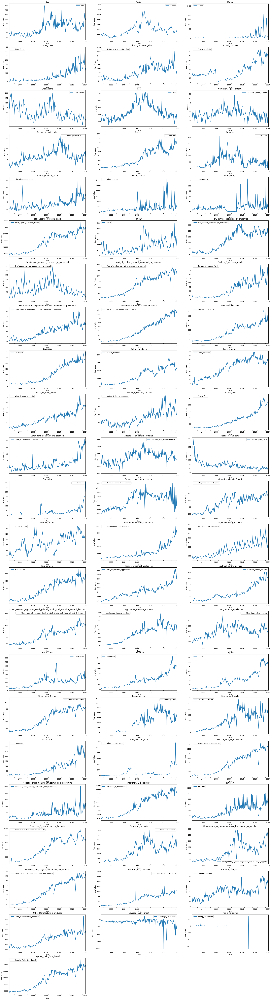

In [23]:
#plot all components timeseries trend (Raw Value)
num_columns = 3 
num_rows = (len(df_export_ANALYSIS.columns) + num_columns - 1) // num_columns  
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(30, 5*num_rows))
axes = axes.flatten()

for i, column in enumerate(df_export_ANALYSIS.columns):
    df_export_ANALYSIS[column].plot(ax=axes[i], title=column, legend=True)
    axes[i].set_xlabel('Date')  
    axes[i].set_ylabel('Raw Value')
    
# Hide empty subplots
for ax in axes[len(df_export_ANALYSIS.columns):]:
    ax.axis('off')


plt.show()


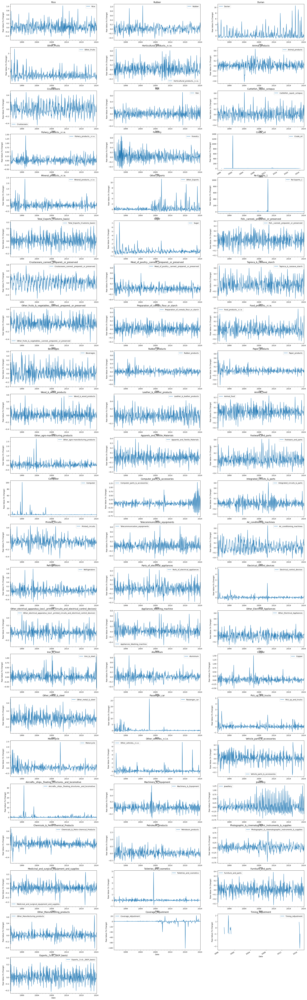

In [24]:
#plot all components timeseries trend (Raw Value % Change)
num_columns = 3 
num_rows = (len(df_export_ANALYSIS.columns) + num_columns - 1) // num_columns  
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(30, 5*num_rows))
axes = axes.flatten()

for i, column in enumerate(df_export_ANALYSIS.columns):
    df_export_ANALYSIS[column].pct_change().dropna().plot(ax=axes[i], title=column, legend=True)
    axes[i].set_xlabel('Date')  
    axes[i].set_ylabel('Raw Value (% Change)')
    
# Hide empty subplots
for ax in axes[len(df_export_ANALYSIS.columns):]:
    ax.axis('off')


plt.show()


# Upcoming Notebook `1_Composote_export_value.ipynb`: check statistical properties of timeseries & Out of Sample forecasting of export value for individual components

# Upcoming Notebook `2_composite_weight_analysis.ipynb`: check if weights change drastically across months and Out of Sample forecast of next month(t) using last release(t-1,...,t-ar_lag)

# Upcoming Notebook `3_stitching_series.ipynb`: Restitching the Components into the Total Export Series(BoP) with Error Optimisation